<a href="https://colab.research.google.com/github/satishgc227/Derby-project/blob/main/Real_Horse_problem_solve.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.rcParams['font.size'] = 12
plt.rcParams['figure.figsize'] = (15, 10)

from sklearn.preprocessing import OneHotEncoder
from sklearn.cluster import KMeans
from imblearn.over_sampling  import RandomOverSampler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score,precision_score,f1_score

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

import tensorflow
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, Dropout



In [2]:
df=pd.read_csv("/content/edited complete.csv",encoding='latin')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [3]:
df.describe()

,race_number,trakus_index,latitude,longitude,distance_id,run_up_distance,purse,post_time,weight_carried,odds,position_at_finish
count,123405.000000,123405.000000,123405.000000,123405.000000,123405.000000,123405.000000,123405.000000,123405.000000,123405.000000,123404.000000,123404.000000
mean,4.952992,203.750521,41.125571,-73.785627,838.696568,58.257526,64653.757951,455.610145,123.391111,1729.011661,4.640101
std,2.708602,151.194384,0.922161,0.047210,308.530029,32.137290,70167.552530,339.125306,8.131926,2068.119153,2.355641
min,1.000000,1.000000,40.666762,-73.832555,550.000000,0.000000,16000.000000,100.000000,111.000000,30.000000,1.000000
25%,3.000000,93.000000,40.672625,-73.829573,650.000000,44.000000,38000.000000,233.000000,120.000000,460.000000,3.000000
50%,5.000000,186.000000,40.675602,-73.827106,800.000000,54.000000,55000.000000,343.000000,122.000000,900.000000,5.000000
75%,7.000000,279.000000,40.716976,-73.726900,850.000000,76.000000,70000.000000,518.000000,124.000000,2120.000000,6.000000
max,13.000000,1062.000000,43.073957,-73.716037,2000.000000,175.000000,1000000.000000,1259.000000,156.000000,12150.000000,11.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123405 entries, 0 to 123404
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   track_id             123405 non-null  object 
 1   race_date            123405 non-null  object 
 2   race_number          123405 non-null  int64  
 3   program_number       123405 non-null  object 
 4   trakus_index         123405 non-null  int64  
 5   latitude             123405 non-null  float64
 6   longitude            123405 non-null  float64
 7   distance_id          123405 non-null  int64  
 8   course_type          123405 non-null  object 
 9   track_condition      123405 non-null  object 
 10  run_up_distance      123405 non-null  int64  
 11  race_type            123405 non-null  object 
 12  purse                123405 non-null  int64  
 13  post_time            123405 non-null  int64  
 14  weight_carried       123405 non-null  int64  
 15  jockey           

In [5]:
df.shape

(123405, 18)

In [6]:
fig = px.scatter(df, 
                   x='course_type',
                   y='odds',
                   color='odds',
                   template='seaborn',
                   labels={"course_type": "Course Type", "odds":"Odds"},
                   title='Winning Odds and Course Type ')

fig.update_layout(xaxis_title="Course Type ",yaxis_title="Odds")
fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'})

fig.show()

In [7]:
fig = px.scatter(df, 
                   y='purse',
                   x='race_number\xa0',
                   color='purse',
                   template='ggplot2',
                   labels={"purse": "Purse", 'race_number\xa0': "Race Number"},
                   title='Purse and Race Number')



fig.show()


In [8]:
fig = px.scatter(df, 
                   y='odds',
                   x='race_number\xa0',
                   color='odds',
                   template='plotly_white',
                   labels={"odds": "Odds", 'race_number\xa0': "Race Number"},
                   title='Winning Odds and Race Number')
fig.show()

In [9]:
fig = px.scatter(df, 
                   y='odds',
                   x='race_date',
                 color='odds',
                   template='ygridoff',
                   labels={"odds": "Odds", 'race_date': "Race Date"},
                   title='Winning Odds and Race Date')
fig.show()

In [10]:
fig = px.scatter(df, 
                   x='race_number\xa0',
                   y='run_up_distance\xa0',
                   color='run_up_distance\xa0',
                   template='ggplot2',
                   labels={"race_number\xa0": "Race Number", 'run_up_distance\xa0': "Run Up Distance"},
                   title='Run Up Distance and Race Number')


fig.show()

In [11]:
fig = px.histogram(df, 
                   y='weight_carried\xa0',
                   x="track_condition\xa0",
                   
                   log_y=True,
                   text_auto=True,
                   template='simple_white',
                   labels={"weight_carried\xa0": "Weight Carried", "track_condition\xa0":"Track Condition"},
                   title='Weight Carried and Track Condition')
fig.update_xaxes(categoryorder='total descending')
fig.show()

In [12]:
print('The Average Weight Carried is',np.around(np.mean(df['weight_carried\xa0']),2))

The Average Weight Carried is 123.39


In [13]:
fig = px.scatter(df, 
                   x='race_type\xa0',
                   y="weight_carried\xa0",
                   
                  template='simple_white',
                  labels={"race_type\xa0": "Race Type", "weight_carried\xa0":"Weight Carried"})
                   

fig.update_layout(xaxis_title="Race Type ",yaxis_title="Weight Carried")

fig.show()

In [14]:
fig = px.histogram(df, 
                   y='run_up_distance\xa0',
                   x='track_condition\xa0',
                  
                   log_y=True,
                   text_auto=True,
                   template='simple_white',
                   labels={"run_up_distance\xa0": "Run Up Distance", "track_condition\xa0":"Track Condition"},
                   title='Run Up Distance and Track Condition')

fig.update_layout(xaxis_title="Track Condition ",yaxis_title="Run Up Distance", bargap=0.1)

fig.show()

In [15]:
#sns.kdeplot(data=df,x='latitude\xa0',y='longitude\xa0',shade=True ,shade_lowest=False,cbar=True)

Data Preprocessing:


In [16]:
df.dtypes

track_id                object
race_date               object
race_number              int64
program_number          object
trakus_index             int64
latitude               float64
longitude              float64
distance_id              int64
course_type             object
track_condition         object
run_up_distance          int64
race_type               object
purse                    int64
post_time                int64
weight_carried           int64
jockey                  object
odds                   float64
position_at_finish     float64
dtype: object

In [17]:
df['race_type\xa0'].unique()
df['course_type'].unique()
df['track_condition\xa0'].unique()
df['track_id'].unique()

s=df[['race_type\xa0','course_type','track_condition\xa0','track_id']]


In [18]:
ohe=OneHotEncoder()
feature_array=ohe.fit_transform(df[['race_type\xa0','course_type','track_condition\xa0','track_id']]).toarray()

In [19]:
feature_labels=ohe.categories_
print(feature_labels)

[array(['ALW', 'AOC', 'CLM', 'SHP', 'SOC', 'SST', 'STK', 'STR', 'WCL'],
      dtype=object), array(['D', 'I', 'M', 'O', 'T'], dtype=object), array(['FM ', 'FT ', 'GD ', 'MY ', 'SY ', 'YL '], dtype=object), array(['AQU', 'BEL', 'SAR'], dtype=object)]


In [20]:
np.array(feature_labels).flatten()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



array([array(['ALW', 'AOC', 'CLM', 'SHP', 'SOC', 'SST', 'STK', 'STR', 'WCL'],
             dtype=object)                                                   ,
       array(['D', 'I', 'M', 'O', 'T'], dtype=object),
       array(['FM ', 'FT ', 'GD ', 'MY ', 'SY ', 'YL '], dtype=object),
       array(['AQU', 'BEL', 'SAR'], dtype=object)], dtype=object)

In [21]:
np.hstack(feature_labels)

array(['ALW', 'AOC', 'CLM', 'SHP', 'SOC', 'SST', 'STK', 'STR', 'WCL', 'D',
       'I', 'M', 'O', 'T', 'FM ', 'FT ', 'GD ', 'MY ', 'SY ', 'YL ',
       'AQU', 'BEL', 'SAR'], dtype=object)

In [22]:
feature_labels=np.hstack(feature_labels)


In [23]:
f=pd.DataFrame(feature_array,columns=feature_labels)

In [24]:
pd.concat([df,f],axis=1)

,track_id,race_date,race_number,program_number,trakus_index,latitude,longitude,distance_id,course_type,track_condition,...,T,FM,FT,GD,MY,SY,YL,AQU,BEL,SAR
0,AQU,01-01-2019,9,6,73,40.672946,-73.827587,600,D,GD,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
1,AQU,01-01-2019,9,6,74,40.672990,-73.827568,600,D,GD,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
2,AQU,01-01-2019,9,6,63,40.672510,-73.827781,600,D,GD,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
3,AQU,01-01-2019,9,6,64,40.672553,-73.827762,600,D,GD,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
4,AQU,01-01-2019,9,6,65,40.672596,-73.827742,600,D,GD,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123400,BEL,18-09-2019,6,2,193,40.714600,-73.725558,600,I,FM,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
123401,BEL,18-09-2019,6,2,194,40.714583,-73.725502,600,I,FM,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
123402,BEL,18-09-2019,6,2,195,40.714565,-73.725446,600,I,FM,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
123403,BEL,18-09-2019,6,2,196,40.714548,-73.725390,600,I,FM,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [25]:
km=KMeans()


In [26]:
df.drop(['race_date','track_id','course_type','track_condition\xa0','race_type\xa0'],axis=1,inplace=True)

In [27]:
df=pd.concat([df,f],axis=1)

In [35]:

df.dtypes
df.drop(['jockey\xa0','program_number\xa0'],axis=1,inplace=True)
df

,race_number,trakus_index,latitude,longitude,distance_id,run_up_distance,purse,post_time,weight_carried,odds,...,T,FM,FT,GD,MY,SY,YL,AQU,BEL,SAR
0,9,73,40.672946,-73.827587,600,48,25000,420,120,2090.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
1,9,74,40.672990,-73.827568,600,48,25000,420,120,2090.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
2,9,63,40.672510,-73.827781,600,48,25000,420,120,2090.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
3,9,64,40.672553,-73.827762,600,48,25000,420,120,2090.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
4,9,65,40.672596,-73.827742,600,48,25000,420,120,2090.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123399,6,204,40.714418,-73.724951,600,135,66000,538,121,780.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
123400,6,193,40.714600,-73.725558,600,135,66000,538,121,780.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
123401,6,194,40.714583,-73.725502,600,135,66000,538,121,780.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
123402,6,195,40.714565,-73.725446,600,135,66000,538,121,780.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [36]:
df.dropna(inplace=True)


In [37]:
wcss = []

for i in range(1,11):
    km = KMeans(n_clusters=i)
    
    km.fit_predict(df)
    wcss.append(km.inertia_)
    print('For', i,'Cluster,', np.around(km.inertia_,2),'is the WCSS.')

For 1 Cluster, 608134500644989.5 is the WCSS.
For 2 Cluster, 216641672536726.9 is the WCSS.
For 3 Cluster, 105735302533061.45 is the WCSS.
For 4 Cluster, 46353463449523.77 is the WCSS.
For 5 Cluster, 16756623718635.26 is the WCSS.
For 6 Cluster, 9800574055234.44 is the WCSS.
For 7 Cluster, 6636198138615.06 is the WCSS.
For 8 Cluster, 4269355910602.08 is the WCSS.
For 9 Cluster, 3474886106946.97 is the WCSS.
For 10 Cluster, 2550916801912.4 is the WCSS.


In [38]:
fig = px.line(x = range(1,11),
              y=wcss, 
              template='simple_white',
              title = 'Elbow Plot', markers=True,
             color_discrete_sequence=["skyblue"])

fig.update_layout(xaxis_title="Clusters",yaxis_title=" WCSS")


fig.show()

In [39]:
km = KMeans(n_clusters=6)
y_means = km.fit_predict(df)
y_means

array([0, 0, 0, ..., 3, 3, 3], dtype=int32)

In [40]:
df['Target'] = y_means
X = df[df.columns[:-1]].values
y = df[df.columns[-1]].values

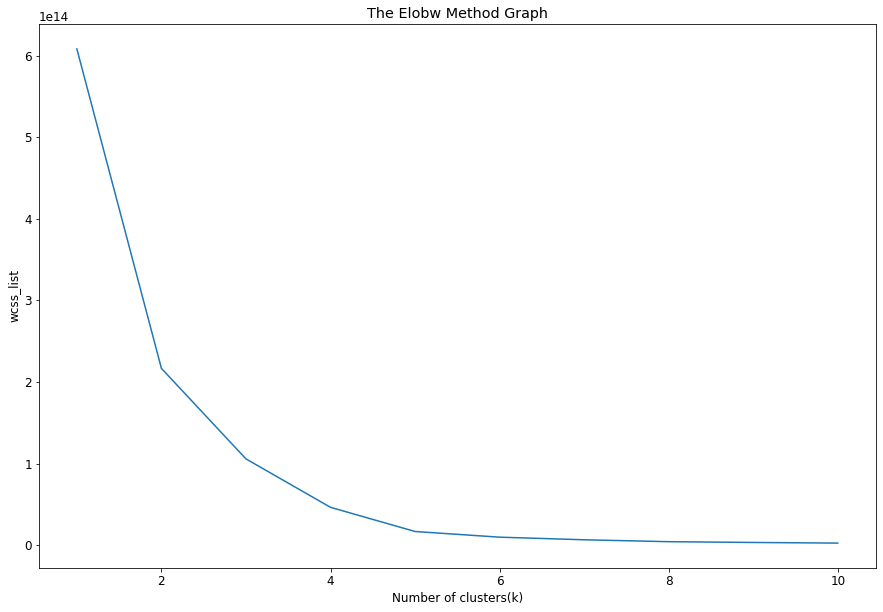

In [42]:
#finding optimal number of clusters using the elbow method  
from sklearn.cluster import KMeans  
wcss_list= []  #Initializing the list for the values of WCSS  
  
#Using for loop for iterations from 1 to 10.  
for i in range(1, 11):  
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state= 42)  
    kmeans.fit(df)  
    wcss_list.append(kmeans.inertia_)  
plt.plot(range(1, 11), wcss_list)  
plt.title('The Elobw Method Graph')  
plt.xlabel('Number of clusters(k)')  
plt.ylabel('wcss_list')  
plt.show()  

In [44]:
kmeans = KMeans(n_clusters=5, init='k-means++', random_state= 42)  
y_predict= kmeans.fit_predict(df)  

In [46]:
#visulaizing the clusters  
#plt.scatter(df[y_predict == 0, 0], df[y_predict == 0, 1], s = 100, c = 'blue', label = 'Cluster 1') #for first cluster  
#plt.scatter(df[y_predict == 1, 0], df[y_predict == 1, 1], s = 100, c = 'green', label = 'Cluster 2') #for second cluster  
#plt.scatter(df[y_predict== 2, 0], df
#            [y_predict == 2, 1], s = 100, c = 'red', label = 'Cluster 3') #for third cluster  
#plt.scatter(df[y_predict == 3, 0], df[y_predict == 3, 1], s = 100, c = 'cyan', label = 'Cluster 4') #for fourth cluster  
#plt.scatter(df[y_predict == 4, 0], df[y_predict == 4, 1], s = 100, c = 'magenta', label = 'Cluster 5') #for fifth cluster  
#plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 300, c = 'yellow', label = 'Centroid')   
#plt.title('Clusters of customers')  
#plt.xlabel('Annual Income (k$)')  
#plt.ylabel('Spending Score (1-100)')  
#plt.legend()  
#plt.show()  

TypeError: ignored